# Multi-class Dog Breed Classification using TenserFlow.

## Problem :
Identifying the breed of a dog in a given image.

## Data :
The data is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data


## Evaluation :
Submissions are evaluated on Multi Class Log Loss between the predicted probability and the observed target.
For each image in the test set we must predict a probability for each of the different breeds. 

## Features :
* Our data is unstructured (images) that's why we will use deep learning 
* there is 120 different breeds of dogs (120 Classes)
* there is more than 10,000 images in train set with labels
* we also have 10,000+ images in the test set without labels (we have to predict them)


In [15]:
# unzip our data to google drive
#!unzip "drive/My Drive/dog-breed-data/dog-breed-identification.zip" -d "drive/My Drive/dog-breed-data"

## Gettting our Workspace Ready

In [16]:
import tensorflow as tf
import tensorflow_hub as hub
print("TensorFlow:", tf.__version__)
print("Hub:", hub.__version__ )
# GPU availability check
print("GPU:", "available" if tf.config.list_physical_devices("GPU") else "Not available")

TensorFlow: 2.3.0
Hub: 0.10.0
GPU: available


## Getting Data Ready

In [17]:
# check the labels of the data
import pandas as pd
labels_csv = pd.read_csv("drive/My Drive/dog-breed-data/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     0fa302727af44e7ad8033825cea98d7c  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


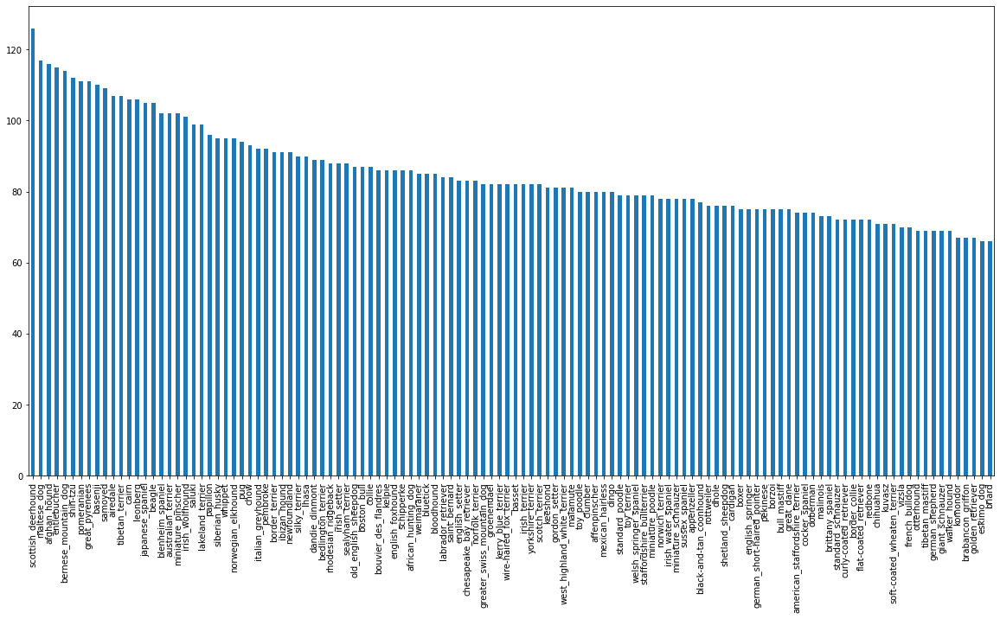

In [18]:
## How many images for each breed are there?
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10));

In [19]:
labels_csv['breed'].value_counts().median()

82.0

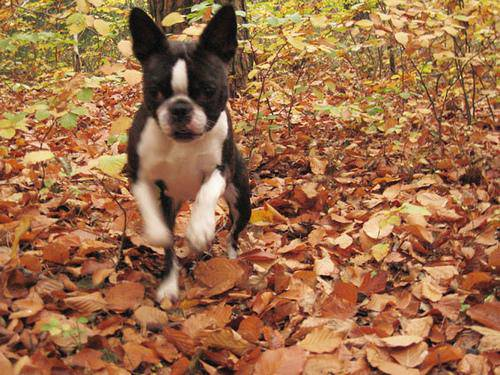

In [20]:
# Viewing an image
from IPython.display import Image
Image("drive/My Drive/dog-breed-data/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

We need to make a list containing all of our image files pathnames

In [21]:
filenames = ["drive/My Drive/dog-breed-data/train/" + fname +".jpg" for fname in labels_csv['id']]
filenames[:20]

['drive/My Drive/dog-breed-data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/dog-breed-data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/dog-breed-data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/dog-breed-data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/dog-breed-data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/dog-breed-data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/dog-breed-data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/dog-breed-data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/dog-breed-data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/dog-breed-data/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/My Drive/dog-breed-data/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/My Drive/dog-breed-data/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/My Drive/dog-breed-data/train/00693b8bc2470375cc744a6391d397ec.jpg',

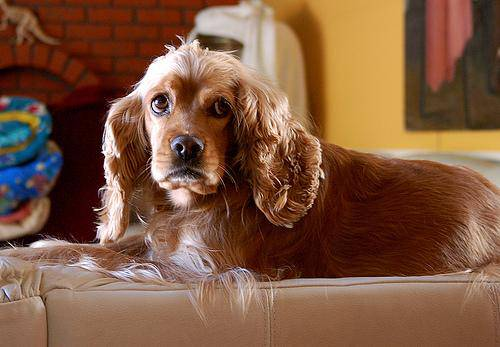

In [22]:
Image(filenames[5555])

after we got our filepaths in a list, we will prepare our labels.

In [23]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [24]:
len(labels), len(filenames)

(10222, 10222)

In [25]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [26]:
 # turning each label to boolean array
 boolean_labels = [label == unique_breeds for label in labels]
 boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [27]:
# in case we wanted to turn it to int data type
boolean_labels[0].astype(int)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

### Creating our Validation Set 
 as the dataset from kaggle came with train and test sets only.

In [28]:
X = filenames
y = boolean_labels

We will start with 1000 images to experiment on then increase as needed

In [29]:
# set number of images for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step:100}

In [30]:
# splitting data to train and validation sets
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [31]:
X_train[:3], y_train[:2]

(['drive/My Drive/dog-breed-data/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/dog-breed-data/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/dog-breed-data/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, F

### Preprocessing images (Turning it to Tensors)

In [32]:
# Image size
IMG_SIZE = 224

# function for preprocessing images
def process_img(image_path):
  """ Turn Image into a Tensor
  """
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

### Turning data into batches

In [33]:
# function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes image file path and label and processes the image
  and return a tuple of (image, label)
  """
  image = process_img(image_path)
  return (image, label)

In [34]:
BATCH_SIZE = 32
def create_data_batches(X,y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creat batches of data of image X and label y.
  Shuffles data if it's training data and doesn't shuffle if it's validation data.
  Accepts test data as input too
  """
  # If data is test set, then we don't have labels
  if test_data:
    print("Creating test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_img).batch(BATCH_SIZE)
    return data_batch

  # if data is a validation set, we don't need to shuffle
  elif valid_data:
    print("Creating validation data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data baches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data = data.shuffle(buffer_size=len(X) )
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch



In [35]:
# creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data baches
Creating validation data batches


## Visualizing Data Batches

In [36]:
import matplotlib.pyplot as plt
# Function for viewing images in a data batch
def plot_25_images(images, labels):
  """
  Display a plot of 25 images and their labels from a batch.
  """
  plt.figure(figsize=(10, 10))
  for i in range(25):
    ax = plt.subplot(5,5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [37]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

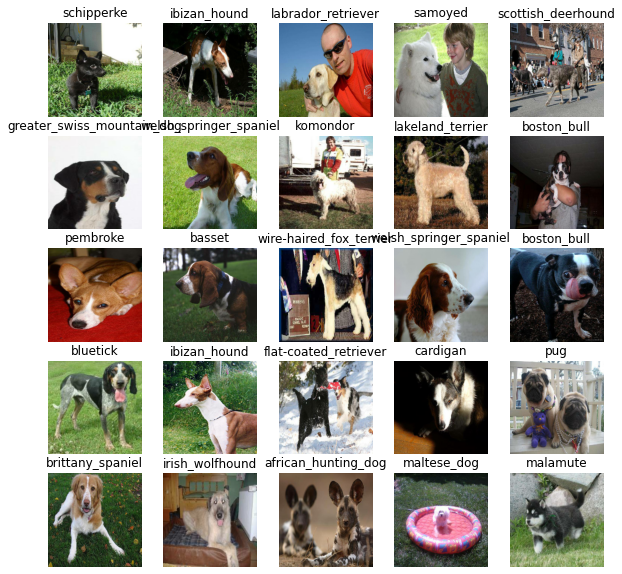

In [24]:
plot_25_images(train_images, train_labels)

## Building The Model
we will use imagenet-mobilenet_v2_130_224-classification model from Tensorflow Hub
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [38]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup Model URL from TF Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [39]:
 # Create a function that builds a Keras mode
 def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
   """
   Creates a model
   """
   print("Building model with:", MODEL_URL )

   # Setup model layers
   model = tf.keras.Sequential([
                                hub.KerasLayer(MODEL_URL), # input layer
                                tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                                                      activation="softmax") # output layer
                                ])
   # Compile the model
   model.compile(
       loss=tf.keras.losses.CategoricalCrossentropy(),
       optimizer=tf.keras.optimizers.Adam(), 
       metrics=["accuracy"]
   )

   # Build the model
   model.build(INPUT_SHAPE)

   return model

In [27]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks
we will create two callbacks, one for Tensorboard which tracks the progress ofour model and the other for early stopping which prevents our model for trainig for too long 

### TensorBoard Callback

In [40]:
# load tensorboard nootbook extension
%load_ext tensorboard

In [41]:
import datetime
import os

# create a function to make a tensorboard callback
def create_tensorboard_callback():
  # create a log directory for storing Tensorboard logs
  logdir = os.path.join("drive/My Drive/dog-breed-data/logs", 
                        # logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


### Early Stopping Callback

In [42]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor="val_accuray", 
                                              patience=3)

## Training a model on a subset of data

we will train this model on 1000 images only .

In [43]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10} 

In [32]:
# check for GPU
print("available" if tf.config.list_physical_devices("GPU") else "not available")

available


In [44]:
# function to train a model
def train_model():
  """
  Trains a given model and returns the trained version of the model.
  """
  model = create_model()

  tensorboard = create_tensorboard_callback()

  model.fit(x=train_data, 
            epochs=NUM_EPOCHS, 
            validation_data=val_data, 
            validation_freq=1,
            callbacks=[tensorboard, early_stop])
  
  return model

In [34]:
# fitting our model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 1/25 [>.............................] - ETA: 0s - loss: 5.5967 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


25/25 [==============================] - ETA: 0s - loss: 4.7254 - accuracy: 0.0750 WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 344s 14s/step - loss: 4.7254 - accuracy: 0.0750 - val_loss: 3.3881 - val_accuracy: 0.3050
Epoch 2/100
25/25 [==============================] - ETA: 0s - loss: 1.7323 - accuracy: 0.6388WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 172ms/step - loss: 1.7323 - accuracy: 0.6388 - val_loss: 2.2090 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - ETA: 0s - loss: 0.6042 - accuracy: 0.9237WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 171ms/step - loss: 0.6042 - accuracy: 0.9237 - val_loss: 1.7137 - val_accuracy: 0.5550
Epoch 4/100
25/25 [==============================] - ETA: 0s - loss: 0.2641 - accuracy: 0.9875WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 173ms/step - loss: 0.2641 - accuracy: 0.9875 - val_loss: 1.4805 - val_accuracy: 0.5850
Epoch 5/100
25/25 [==============================] - ETA: 0s - loss: 0.1530 - accuracy: 0.9962WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 171ms/step - loss: 0.1530 - accuracy: 0.9962 - val_loss: 1.3938 - val_accuracy: 0.6050
Epoch 6/100
25/25 [==============================] - ETA: 0s - loss: 0.1022 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 171ms/step - loss: 0.1022 - accuracy: 1.0000 - val_loss: 1.3513 - val_accuracy: 0.6100
Epoch 7/100
25/25 [==============================] - ETA: 0s - loss: 0.0775 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 172ms/step - loss: 0.0775 - accuracy: 1.0000 - val_loss: 1.3243 - val_accuracy: 0.6100
Epoch 8/100
25/25 [==============================] - ETA: 0s - loss: 0.0616 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 172ms/step - loss: 0.0616 - accuracy: 1.0000 - val_loss: 1.2978 - val_accuracy: 0.6250
Epoch 9/100
25/25 [==============================] - ETA: 0s - loss: 0.0502 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 173ms/step - loss: 0.0502 - accuracy: 1.0000 - val_loss: 1.2813 - val_accuracy: 0.6150
Epoch 10/100
25/25 [==============================] - ETA: 0s - loss: 0.0423 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 172ms/step - loss: 0.0423 - accuracy: 1.0000 - val_loss: 1.2676 - val_accuracy: 0.6350
Epoch 11/100
25/25 [==============================] - ETA: 0s - loss: 0.0363 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 175ms/step - loss: 0.0363 - accuracy: 1.0000 - val_loss: 1.2513 - val_accuracy: 0.6400
Epoch 12/100
25/25 [==============================] - ETA: 0s - loss: 0.0316 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 172ms/step - loss: 0.0316 - accuracy: 1.0000 - val_loss: 1.2429 - val_accuracy: 0.6400
Epoch 13/100
25/25 [==============================] - ETA: 0s - loss: 0.0279 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 172ms/step - loss: 0.0279 - accuracy: 1.0000 - val_loss: 1.2296 - val_accuracy: 0.6450
Epoch 14/100
25/25 [==============================] - ETA: 0s - loss: 0.0249 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 172ms/step - loss: 0.0249 - accuracy: 1.0000 - val_loss: 1.2260 - val_accuracy: 0.6450
Epoch 15/100
25/25 [==============================] - ETA: 0s - loss: 0.0223 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 172ms/step - loss: 0.0223 - accuracy: 1.0000 - val_loss: 1.2202 - val_accuracy: 0.6550
Epoch 16/100
25/25 [==============================] - ETA: 0s - loss: 0.0202 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 172ms/step - loss: 0.0202 - accuracy: 1.0000 - val_loss: 1.2103 - val_accuracy: 0.6550
Epoch 17/100
25/25 [==============================] - ETA: 0s - loss: 0.0184 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 171ms/step - loss: 0.0184 - accuracy: 1.0000 - val_loss: 1.2063 - val_accuracy: 0.6550
Epoch 18/100
25/25 [==============================] - ETA: 0s - loss: 0.0168 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 170ms/step - loss: 0.0168 - accuracy: 1.0000 - val_loss: 1.2025 - val_accuracy: 0.6550
Epoch 19/100
25/25 [==============================] - ETA: 0s - loss: 0.0155 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 168ms/step - loss: 0.0155 - accuracy: 1.0000 - val_loss: 1.1984 - val_accuracy: 0.6550
Epoch 20/100
25/25 [==============================] - ETA: 0s - loss: 0.0143 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 150ms/step - loss: 0.0143 - accuracy: 1.0000 - val_loss: 1.1950 - val_accuracy: 0.6500
Epoch 21/100
25/25 [==============================] - ETA: 0s - loss: 0.0133 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 151ms/step - loss: 0.0133 - accuracy: 1.0000 - val_loss: 1.1911 - val_accuracy: 0.6550
Epoch 22/100
25/25 [==============================] - ETA: 0s - loss: 0.0124 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 151ms/step - loss: 0.0124 - accuracy: 1.0000 - val_loss: 1.1896 - val_accuracy: 0.6600
Epoch 23/100
25/25 [==============================] - ETA: 0s - loss: 0.0115 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 152ms/step - loss: 0.0115 - accuracy: 1.0000 - val_loss: 1.1864 - val_accuracy: 0.6500
Epoch 24/100
25/25 [==============================] - ETA: 0s - loss: 0.0108 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 156ms/step - loss: 0.0108 - accuracy: 1.0000 - val_loss: 1.1825 - val_accuracy: 0.6550
Epoch 25/100
25/25 [==============================] - ETA: 0s - loss: 0.0101 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 176ms/step - loss: 0.0101 - accuracy: 1.0000 - val_loss: 1.1798 - val_accuracy: 0.6650
Epoch 26/100
25/25 [==============================] - ETA: 0s - loss: 0.0095 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 169ms/step - loss: 0.0095 - accuracy: 1.0000 - val_loss: 1.1764 - val_accuracy: 0.6600
Epoch 27/100
25/25 [==============================] - ETA: 0s - loss: 0.0090 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 170ms/step - loss: 0.0090 - accuracy: 1.0000 - val_loss: 1.1754 - val_accuracy: 0.6650
Epoch 28/100
25/25 [==============================] - ETA: 0s - loss: 0.0085 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 171ms/step - loss: 0.0085 - accuracy: 1.0000 - val_loss: 1.1734 - val_accuracy: 0.6700
Epoch 29/100
25/25 [==============================] - ETA: 0s - loss: 0.0080 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 172ms/step - loss: 0.0080 - accuracy: 1.0000 - val_loss: 1.1753 - val_accuracy: 0.6700
Epoch 30/100
25/25 [==============================] - ETA: 0s - loss: 0.0076 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 168ms/step - loss: 0.0076 - accuracy: 1.0000 - val_loss: 1.1709 - val_accuracy: 0.6650
Epoch 31/100
25/25 [==============================] - ETA: 0s - loss: 0.0072 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 167ms/step - loss: 0.0072 - accuracy: 1.0000 - val_loss: 1.1697 - val_accuracy: 0.6650
Epoch 32/100
25/25 [==============================] - ETA: 0s - loss: 0.0069 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 171ms/step - loss: 0.0069 - accuracy: 1.0000 - val_loss: 1.1683 - val_accuracy: 0.6650
Epoch 33/100
25/25 [==============================] - ETA: 0s - loss: 0.0065 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 168ms/step - loss: 0.0065 - accuracy: 1.0000 - val_loss: 1.1663 - val_accuracy: 0.6700
Epoch 34/100
25/25 [==============================] - ETA: 0s - loss: 0.0063 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 168ms/step - loss: 0.0063 - accuracy: 1.0000 - val_loss: 1.1669 - val_accuracy: 0.6700
Epoch 35/100
25/25 [==============================] - ETA: 0s - loss: 0.0060 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 169ms/step - loss: 0.0060 - accuracy: 1.0000 - val_loss: 1.1655 - val_accuracy: 0.6700
Epoch 36/100
25/25 [==============================] - ETA: 0s - loss: 0.0057 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 169ms/step - loss: 0.0057 - accuracy: 1.0000 - val_loss: 1.1647 - val_accuracy: 0.6700
Epoch 37/100
25/25 [==============================] - ETA: 0s - loss: 0.0055 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 168ms/step - loss: 0.0055 - accuracy: 1.0000 - val_loss: 1.1625 - val_accuracy: 0.6700
Epoch 38/100
25/25 [==============================] - ETA: 0s - loss: 0.0052 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 166ms/step - loss: 0.0052 - accuracy: 1.0000 - val_loss: 1.1624 - val_accuracy: 0.6700
Epoch 39/100
25/25 [==============================] - ETA: 0s - loss: 0.0050 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 158ms/step - loss: 0.0050 - accuracy: 1.0000 - val_loss: 1.1611 - val_accuracy: 0.6700
Epoch 40/100
25/25 [==============================] - ETA: 0s - loss: 0.0048 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 155ms/step - loss: 0.0048 - accuracy: 1.0000 - val_loss: 1.1603 - val_accuracy: 0.6700
Epoch 41/100
25/25 [==============================] - ETA: 0s - loss: 0.0046 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 161ms/step - loss: 0.0046 - accuracy: 1.0000 - val_loss: 1.1598 - val_accuracy: 0.6700
Epoch 42/100
25/25 [==============================] - ETA: 0s - loss: 0.0044 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 163ms/step - loss: 0.0044 - accuracy: 1.0000 - val_loss: 1.1600 - val_accuracy: 0.6700
Epoch 43/100
25/25 [==============================] - ETA: 0s - loss: 0.0043 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 163ms/step - loss: 0.0043 - accuracy: 1.0000 - val_loss: 1.1586 - val_accuracy: 0.6700
Epoch 44/100
25/25 [==============================] - ETA: 0s - loss: 0.0041 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 165ms/step - loss: 0.0041 - accuracy: 1.0000 - val_loss: 1.1592 - val_accuracy: 0.6700
Epoch 45/100
25/25 [==============================] - ETA: 0s - loss: 0.0040 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 165ms/step - loss: 0.0040 - accuracy: 1.0000 - val_loss: 1.1579 - val_accuracy: 0.6700
Epoch 46/100
25/25 [==============================] - ETA: 0s - loss: 0.0038 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 161ms/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 1.1579 - val_accuracy: 0.6700
Epoch 47/100
25/25 [==============================] - ETA: 0s - loss: 0.0037 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 167ms/step - loss: 0.0037 - accuracy: 1.0000 - val_loss: 1.1556 - val_accuracy: 0.6700
Epoch 48/100
25/25 [==============================] - ETA: 0s - loss: 0.0036 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 166ms/step - loss: 0.0036 - accuracy: 1.0000 - val_loss: 1.1565 - val_accuracy: 0.6700
Epoch 49/100
25/25 [==============================] - ETA: 0s - loss: 0.0035 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 165ms/step - loss: 0.0035 - accuracy: 1.0000 - val_loss: 1.1563 - val_accuracy: 0.6700
Epoch 50/100
25/25 [==============================] - ETA: 0s - loss: 0.0033 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 164ms/step - loss: 0.0033 - accuracy: 1.0000 - val_loss: 1.1571 - val_accuracy: 0.6700
Epoch 51/100
25/25 [==============================] - ETA: 0s - loss: 0.0032 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 165ms/step - loss: 0.0032 - accuracy: 1.0000 - val_loss: 1.1564 - val_accuracy: 0.6700
Epoch 52/100
25/25 [==============================] - ETA: 0s - loss: 0.0031 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 164ms/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 1.1551 - val_accuracy: 0.6700
Epoch 53/100
25/25 [==============================] - ETA: 0s - loss: 0.0030 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 163ms/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 1.1555 - val_accuracy: 0.6700
Epoch 54/100
25/25 [==============================] - ETA: 0s - loss: 0.0029 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 159ms/step - loss: 0.0029 - accuracy: 1.0000 - val_loss: 1.1553 - val_accuracy: 0.6700
Epoch 55/100
25/25 [==============================] - ETA: 0s - loss: 0.0028 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 146ms/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 1.1548 - val_accuracy: 0.6750
Epoch 56/100
25/25 [==============================] - ETA: 0s - loss: 0.0028 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 147ms/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 1.1552 - val_accuracy: 0.6700
Epoch 57/100
25/25 [==============================] - ETA: 0s - loss: 0.0027 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 145ms/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 1.1543 - val_accuracy: 0.6750
Epoch 58/100
25/25 [==============================] - ETA: 0s - loss: 0.0026 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 146ms/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 1.1543 - val_accuracy: 0.6750
Epoch 59/100
25/25 [==============================] - ETA: 0s - loss: 0.0025 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 145ms/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 1.1535 - val_accuracy: 0.6750
Epoch 60/100
25/25 [==============================] - ETA: 0s - loss: 0.0025 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 145ms/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 1.1542 - val_accuracy: 0.6750
Epoch 61/100
25/25 [==============================] - ETA: 0s - loss: 0.0024 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 145ms/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 1.1549 - val_accuracy: 0.6800
Epoch 62/100
25/25 [==============================] - ETA: 0s - loss: 0.0023 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 146ms/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 1.1538 - val_accuracy: 0.6800
Epoch 63/100
25/25 [==============================] - ETA: 0s - loss: 0.0023 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 151ms/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 1.1541 - val_accuracy: 0.6750
Epoch 64/100
25/25 [==============================] - ETA: 0s - loss: 0.0022 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 151ms/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 1.1540 - val_accuracy: 0.6800
Epoch 65/100
25/25 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 151ms/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 1.1543 - val_accuracy: 0.6800
Epoch 66/100
25/25 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 153ms/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 1.1540 - val_accuracy: 0.6800
Epoch 67/100
25/25 [==============================] - ETA: 0s - loss: 0.0020 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 161ms/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 1.1540 - val_accuracy: 0.6800
Epoch 68/100
25/25 [==============================] - ETA: 0s - loss: 0.0020 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 161ms/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 1.1540 - val_accuracy: 0.6800
Epoch 69/100
25/25 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 160ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 1.1542 - val_accuracy: 0.6800
Epoch 70/100
25/25 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 159ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 1.1546 - val_accuracy: 0.6800
Epoch 71/100
25/25 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 161ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 1.1541 - val_accuracy: 0.6800
Epoch 72/100
25/25 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 172ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 1.1542 - val_accuracy: 0.6800
Epoch 73/100
25/25 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 171ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 1.1544 - val_accuracy: 0.6800
Epoch 74/100
25/25 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 159ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 1.1543 - val_accuracy: 0.6800
Epoch 75/100
25/25 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 156ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 1.1550 - val_accuracy: 0.6800
Epoch 76/100
25/25 [==============================] - ETA: 0s - loss: 0.0016 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 155ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 1.1544 - val_accuracy: 0.6800
Epoch 77/100
25/25 [==============================] - ETA: 0s - loss: 0.0016 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 156ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 1.1546 - val_accuracy: 0.6800
Epoch 78/100
25/25 [==============================] - ETA: 0s - loss: 0.0015 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 159ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 1.1545 - val_accuracy: 0.6800
Epoch 79/100
25/25 [==============================] - ETA: 0s - loss: 0.0015 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 161ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 1.1547 - val_accuracy: 0.6800
Epoch 80/100
25/25 [==============================] - ETA: 0s - loss: 0.0015 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 158ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 1.1551 - val_accuracy: 0.6800
Epoch 81/100
25/25 [==============================] - ETA: 0s - loss: 0.0014 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 160ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 1.1556 - val_accuracy: 0.6800
Epoch 82/100
25/25 [==============================] - ETA: 0s - loss: 0.0014 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 161ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 1.1555 - val_accuracy: 0.6800
Epoch 83/100
25/25 [==============================] - ETA: 0s - loss: 0.0014 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 159ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 1.1550 - val_accuracy: 0.6800
Epoch 84/100
25/25 [==============================] - ETA: 0s - loss: 0.0013 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 158ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 1.1560 - val_accuracy: 0.6800
Epoch 85/100
25/25 [==============================] - ETA: 0s - loss: 0.0013 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 159ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 1.1562 - val_accuracy: 0.6750
Epoch 86/100
25/25 [==============================] - ETA: 0s - loss: 0.0013 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 160ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 1.1563 - val_accuracy: 0.6750
Epoch 87/100
25/25 [==============================] - ETA: 0s - loss: 0.0013 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 162ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 1.1559 - val_accuracy: 0.6750
Epoch 88/100
25/25 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 161ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 1.1566 - val_accuracy: 0.6750
Epoch 89/100
25/25 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 158ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 1.1569 - val_accuracy: 0.6750
Epoch 90/100
25/25 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 159ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 1.1583 - val_accuracy: 0.6750
Epoch 91/100
25/25 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 159ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 1.1571 - val_accuracy: 0.6750
Epoch 92/100
25/25 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 158ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 1.1573 - val_accuracy: 0.6750
Epoch 93/100
25/25 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 159ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 1.1573 - val_accuracy: 0.6750
Epoch 94/100
25/25 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 157ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 1.1578 - val_accuracy: 0.6750
Epoch 95/100
25/25 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 158ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 1.1586 - val_accuracy: 0.6750
Epoch 96/100
25/25 [==============================] - ETA: 0s - loss: 0.0010 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 159ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 1.1585 - val_accuracy: 0.6750
Epoch 97/100
25/25 [==============================] - ETA: 0s - loss: 0.0010 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 159ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 1.1588 - val_accuracy: 0.6750
Epoch 98/100
25/25 [==============================] - ETA: 0s - loss: 0.0010 - accuracy: 1.0000    WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 166ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 1.1586 - val_accuracy: 0.6750
Epoch 99/100
25/25 [==============================] - ETA: 0s - loss: 9.8052e-04 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 141ms/step - loss: 9.8052e-04 - accuracy: 1.0000 - val_loss: 1.1585 - val_accuracy: 0.6750
Epoch 100/100
25/25 [==============================] - ETA: 0s - loss: 9.6132e-04 - accuracy: 1.0000WARNING:tensorflow:Early stopping conditioned on metric `val_accuray` which is not available. Available metrics are: loss,accuracy,val_loss,val_accuracy


25/25 [==============================] - 4s 143ms/step - loss: 9.6132e-04 - accuracy: 1.0000 - val_loss: 1.1594 - val_accuracy: 0.6750


Our model finished training and it is overfitting.

### Checking the TensorBoard logs

In [35]:
%tensorboard --logdir drive/My\ Drive/dog-breed-data/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using our trained model

In [36]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 90ms/step


array([[2.0632689e-04, 1.7153388e-05, 3.8526836e-03, ..., 1.9326957e-04,
        2.8009240e-06, 1.6861878e-03],
       [1.9886304e-04, 1.2143472e-04, 1.2190494e-03, ..., 2.7984242e-05,
        2.1794099e-04, 2.0828982e-06],
       [1.5935136e-06, 1.5911706e-06, 1.6098369e-07, ..., 5.4633671e-07,
        3.6111219e-06, 6.0669008e-06],
       ...,
       [7.1502164e-08, 2.8637547e-07, 1.4496585e-06, ..., 5.9412559e-07,
        8.4206840e-06, 2.8939894e-06],
       [8.5236505e-04, 8.1741755e-06, 2.7478034e-05, ..., 1.0836037e-05,
        1.0543452e-05, 2.5617087e-03],
       [2.6519201e-04, 4.9115038e-06, 3.8862368e-04, ..., 7.4523115e-03,
        8.5438485e-05, 7.3350634e-06]], dtype=float32)

In [45]:
# Turn predictions probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [47]:
# function to unbatch a batch dataset
def unbatch_data(data):
  """
  unbatch batched datasets
  """
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatch validation data
#val_images, val_labels = unbatch_data(val_data)
#val_images[0], val_labels[0]

We need to make a function to visualize the predicted data we have got

In [48]:
def plot_pred(prediction_probs, labels, images, n=1):
  """
  View the prediction , ground truth amd image for sample n
  """
  pred_prob, true_label, image = prediction_probs[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)*100, true_label), color=color)


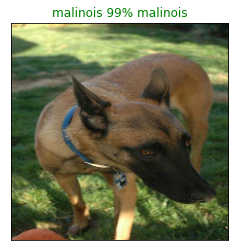

In [77]:
plot_pred(prediction_probs=predictions, labels=val_labels, images=val_images, n=78 )

After we made the previous function we need a function to view the top 10 predictions of our model

In [49]:
def plot_pred_conf(prediction_probs, labels, n=1):
  """
  plots the top 10 highest predictions with their truth label for sample n.
  """
  pred_prob, true_label = prediction_probs[n], labels[n]

  pred_label = get_pred_label(pred_prob) 
  
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  top_10_pred_values = pred_prob[top_10_pred_indexes]

  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)), 
             top_10_pred_labels, 
             rotation="vertical")
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass





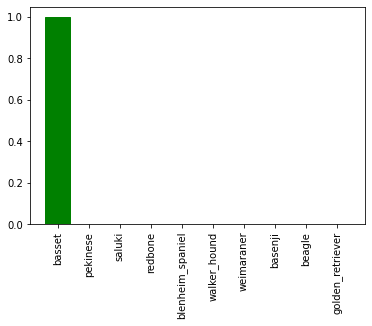

In [96]:
plot_pred_conf(prediction_probs=predictions, labels=val_labels, n=2)

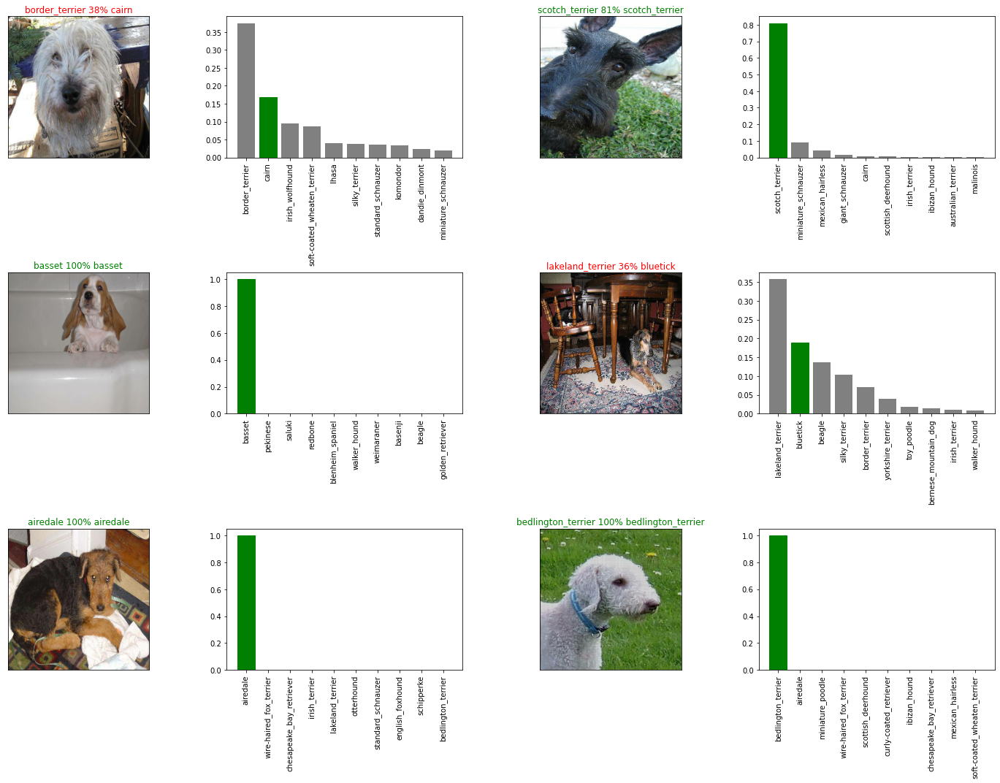

In [95]:
# Let's check some predictions and their values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probs=predictions, labels=val_labels, images=val_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probs=predictions,labels=val_labels, n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving our trained model

In [50]:
# create a function to save a model
def save_model(model, suffix=None):
  """
  saves a given models and appends a suffix.
  """
  modeldir = os.path.join("drive/MyDrive/dog-breed-data/models", 
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format for model
  print(f"Saving model to: {model_path}....")
  model.save(model_path)
  return model_path

In [51]:
# Create function to load the model
def load_model(model_path):
  """
  Loads saved model from specified path
  """
  print(f"Loading saved model from: {model_path}") 
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

after making our functions let us use them

In [114]:
# save model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/dog-breed-data/models/20201205-19031607194999-1000-images-mobilenetv2-Adam.h5....


'drive/MyDrive/dog-breed-data/models/20201205-19031607194999-1000-images-mobilenetv2-Adam.h5'

In [115]:
# load a trained model 
loaded_1000_images_model = load_model("drive/MyDrive/dog-breed-data/models/20201205-19031607194999-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/dog-breed-data/models/20201205-19031607194999-1000-images-mobilenetv2-Adam.h5.....


In [116]:
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 90ms/step - loss: 1.1594 - accuracy: 0.6750


[1.1594326496124268, 0.675000011920929]

# Training our model on the full Data

In [52]:
len(X), len(y)

(10222, 10222)

In [53]:
full_data = create_data_batches(X,y)

Creating training data baches


In [54]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [122]:
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [123]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

In [124]:
full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 3465s 11s/step - loss: 1.3469 - accuracy: 0.6714
Epoch 2/100
320/320 [==============================] - 39s 123ms/step - loss: 0.4098 - accuracy: 0.8778
Epoch 3/100
320/320 [==============================] - 39s 122ms/step - loss: 0.2394 - accuracy: 0.9354
Epoch 4/100
320/320 [==============================] - 39s 121ms/step - loss: 0.1548 - accuracy: 0.9619
Epoch 5/100
320/320 [==============================] - 39s 121ms/step - loss: 0.1063 - accuracy: 0.9790
Epoch 6/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0785 - accuracy: 0.9866
Epoch 7/100
320/320 [==============================] - 38s 120ms/step - loss: 0.0595 - accuracy: 0.9913
Epoch 8/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0461 - accuracy: 0.9942
Epoch 9/100
320/320 [==============================] - 38s 120ms/step - loss: 0.0373 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 38s 119m

In [125]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/dog-breed-data/models/20201205-20481607201293-full-image-set-mobilenetv2-Adam.h5....


'drive/MyDrive/dog-breed-data/models/20201205-20481607201293-full-image-set-mobilenetv2-Adam.h5'

In [55]:
loaded_full_model = load_model("drive/MyDrive/dog-breed-data/models/20201205-20481607201293-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/dog-breed-data/models/20201205-20481607201293-full-image-set-mobilenetv2-Adam.h5


In [62]:
loaded_full_model.evaluate(val_data)

7/7 [==============================] - 29s 4s/step - loss: 0.0041 - accuracy: 1.0000


[0.00413670064881444, 1.0]

##Making predictions on the test Data 
As our model is trained on images in the form of tensor batches , we need to get the test data in the same format to make predictions on it.

In [67]:
# Load test images filenames
test_path ="drive/MyDrive/dog-breed-data/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/dog-breed-data/test/ed9a58ccecb053df2a38486a51501248.jpg',
 'drive/MyDrive/dog-breed-data/test/edd7c1e04601546fc101901d764dc4b4.jpg',
 'drive/MyDrive/dog-breed-data/test/ea02c2e76cd1c51e5a07280ca363dbc5.jpg',
 'drive/MyDrive/dog-breed-data/test/eaba5de4287936fcab47f236d58d3f14.jpg',
 'drive/MyDrive/dog-breed-data/test/ecb6362d105c0cb84d8e69cfd9b8d0b5.jpg',
 'drive/MyDrive/dog-breed-data/test/f4a3d9cf1909fb5d894ff5d5121af9b0.jpg',
 'drive/MyDrive/dog-breed-data/test/e995cac3e30ce4e55d0f203c20cd0986.jpg',
 'drive/MyDrive/dog-breed-data/test/ea5bd02a78f243c609cd227c4a09c6c4.jpg',
 'drive/MyDrive/dog-breed-data/test/ec363521d5ebd5260944823f86dc5a8c.jpg',
 'drive/MyDrive/dog-breed-data/test/f3925f914650b1edf59ce7da36abda31.jpg']

In [68]:
len(test_filenames)

10357

In [69]:
# Creat test data batch
test_data = create_data_batches(test_filenames, test_data=True )

Creating test data batches


In [70]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [71]:
# Make Predictions on test Data Batch using loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 3886s 12s/step


In [73]:
np.savetxt("drive/MyDrive/dog-breed-data/preds_array.csv", test_predictions, delimiter=",")

In [74]:
## preparing test dataset predictions for kaggle
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [76]:
# append test image IDs to the dataframe
test_id = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_id
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ed9a58ccecb053df2a38486a51501248,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,edd7c1e04601546fc101901d764dc4b4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ea02c2e76cd1c51e5a07280ca363dbc5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,eaba5de4287936fcab47f236d58d3f14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ecb6362d105c0cb84d8e69cfd9b8d0b5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [77]:
# add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ed9a58ccecb053df2a38486a51501248,4.80606e-11,3.10536e-08,1.52237e-09,4.54094e-07,1.98116e-09,1.56503e-08,8.33196e-10,1.25742e-12,9.00862e-12,1.64039e-14,3.59839e-08,1.08988e-09,1.04337e-09,2.2527e-12,6.99216e-10,4.18093e-10,2.87766e-06,5.39403e-12,4.1479e-07,3.27625e-11,1.72513e-10,4.21446e-13,7.55622e-12,3.29483e-07,9.37374e-12,5.11038e-13,1.23383e-11,8.47297e-11,1.61947e-09,2.8662e-15,1.15147e-12,2.55786e-11,1.6979e-11,3.27044e-06,7.30262e-11,3.79377e-09,7.11802e-10,4.07676e-11,5.045e-08,...,4.24418e-12,4.59449e-10,6.99473e-06,6.1696e-07,1.68147e-14,2.50126e-11,4.90561e-12,1.04707e-12,1.44527e-12,1.13064e-10,2.32635e-08,2.6042e-10,9.52258e-11,1.24128e-08,2.20608e-10,4.83368e-12,2.58687e-06,0.0101368,5.73427e-08,5.32355e-14,3.25906e-11,3.6421e-12,1.36895e-09,2.0654e-10,9.22055e-12,3.67889e-08,1.27065e-09,2.35418e-10,4.5474e-10,8.13907e-10,1.56477e-15,1.61351e-13,2.7151e-11,4.09551e-05,2.91646e-08,4.89446e-12,1.77607e-08,7.013e-05,1.38565e-06,1.23654e-13
1,edd7c1e04601546fc101901d764dc4b4,7.40551e-15,4.93825e-11,2.43429e-14,2.91839e-13,2.29794e-08,5.00135e-10,1.62075e-13,7.94083e-12,1.0369e-16,4.91105e-15,5.56317e-15,8.85483e-09,7.32817e-15,1.89273e-10,1.32247e-14,1.08636e-10,0.999924,7.30391e-14,1.21498e-09,1.52048e-10,3.89787e-17,9.05109e-15,8.33883e-14,5.44605e-14,1.27132e-11,9.73068e-16,1.77094e-13,2.31861e-10,3.28567e-13,1.80303e-12,2.83219e-14,8.84958e-12,3.51753e-08,6.89188e-05,5.77596e-12,2.83625e-14,1.13709e-12,1.56551e-16,4.70289e-13,...,4.83656e-13,1.71519e-13,1.74465e-10,8.91341e-13,2.53657e-10,2.93361e-12,3.24885e-13,5.56883e-12,5.80271e-13,2.17744e-11,8.6759e-15,9.33066e-13,2.52078e-12,7.44639e-10,8.66503e-10,1.26075e-11,8.22409e-13,6.01149e-11,3.21714e-17,1.35391e-08,8.09206e-12,2.15335e-08,4.22618e-15,1.4811e-16,5.03603e-11,1.41588e-10,4.47075e-14,2.91717e-14,8.43816e-12,1.5601e-11,1.20882e-12,1.44982e-16,2.33981e-13,1.87052e-09,2.0467e-11,4.49257e-12,3.94713e-11,2.00257e-09,4.09008e-12,2.26539e-13
2,ea02c2e76cd1c51e5a07280ca363dbc5,8.40566e-13,1.17099e-11,9.65706e-14,3.09859e-11,2.81247e-11,2.35682e-10,1.02307e-13,6.80567e-13,2.78775e-12,3.32753e-10,8.67065e-12,8.0854e-13,6.53622e-13,3.88001e-11,2.37289e-11,1.37209e-12,5.97801e-11,4.88185e-12,2.30231e-11,1.7915e-09,7.18742e-13,3.27062e-06,3.58709e-14,1.75408e-11,1.6119e-10,1.37693e-07,1.45628e-14,1.9963e-10,2.71443e-12,5.17438e-14,4.21864e-10,1.44097e-10,8.07706e-14,1.48065e-12,1.67036e-14,1.97316e-12,1.71818e-12,4.11621e-11,1.63679e-11,...,1.5278e-12,7.96574e-15,1.0401e-11,4.2953e-14,3.71433e-13,7.96491e-12,1.99287e-13,2.51456e-15,6.70193e-11,4.45286e-14,2.7965e-12,2.52244e-10,0.999996,1.3355e-11,1.28206e-12,5.7277e-14,1.18867e-13,2.37223e-14,5.27228e-10,1.76664e-11,1.98525e-11,5.02133e-12,6.3088e-12,4.72515e-13,3.48808e-15,1.07147e-10,2.67423e-13,3.22798e-12,5.75147e-10,4.60454e-13,9.43715e-13,1.17077e-11,4.14261e-15,1.78078e-10,1.83583e-14,3.47778e-10,2.1946e-13,1.265

In [78]:
# export to csv
preds_df.to_csv("drive/MyDrive/dog-breed-data/full_model_preds_sub1.csv", index=False)